# Artistic style transfer using the VGG-19 convolutional neural network
<p class="lead">
Jeremy Ocampo<br />

## Introduction
The goal of this project was to create and understand the algorithm used for a computer to learn the style and patterns created by an artist and transfer them to a chosen image. The algorithm uses a pretrained deep convolutional neural network, VGG-19, to create neural representations of the style/patterns of the artwork and the features of the chosen content image, from which you can embedd the style/pattern on to the features of the content image. The real life image used was the face of the rapper [Lil Uzi Vert](https://en.wikipedia.org/wiki/Lil_Uzi_Vert) and the artwork used was a [mosaic](https://en.wikipedia.org/wiki/Mosaic) and [thangka](https://en.wikipedia.org/wiki/Thangka)(Tibetan Buddhist painting). We will apply the methods used in the paper ["A Neural Algorithm of Artistic Style"](https://arxiv.org/pdf/1508.06576.pdf) by Gatys et al. There were several parameters in this algorithm that were chosen to create the desired results, an investigation was made to provide an explanation of how they work to optimize the "style transfer". The final results are shown below.

![](mosaicresults.jpg)
![](thangkaresults.jpg)


## 1. Building the layers

In [2]:
#Import the libraries needed
import numpy as np
import scipy.io
import scipy.misc
import tensorflow as tf 
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
%matplotlib inline

In [2]:
#formatting
from IPython.core.display import HTML
HTML("""<style> .rendered_html code { 
    padding: 2px 4px;
    color: #c7254e;
    background-color: #f9f2f4;
    border-radius: 4px;`
} </style>""")

### VGG-19

The **VGG-19** network has been pre-trained on everyday objects and it outputs the probabilities of all the possible objects that the input image can be. We will be using the 19 convolutional layers of the pretrained VGG-19 network as it already responds to the features of an image (e.g. edges of an object). The responses in the layers produced by the content/style image will be the basis of our content/style representation, and we will train the network again using those representations. To download the VGG-19 network click [here](http://www.vlfeat.org/matconvnet/models/imagenet-vgg-verydeep-19.mat), and for more information about VGG visit: http://www.robots.ox.ac.uk/~vgg/research/very_deep/.

### Convolutions

The reason for using a convolutional network is because it allows us to model what is going on around every pixel of an image, this is good because nearby pixels will probably look the same, in contrast a fully connected network will give a set of unique weights for every pixel from each neuron of a layer. 

Recall how a convolutional layer([ conv2d documentation here](https://www.tensorflow.org/api_docs/python/tf/nn/conv2d)) works, it takes as input a tensor with shape `[number of images, image height, image width, no. of channels]`(e.g. no. of channels is 3 for RGB image) and then a kernel is applied onto each image, this [link](http://setosa.io/ev/image-kernels/) explains how the kernel is applied. There is a different kernel for each input channel of an image(this does not have to be 3), and after all of them have been applied to each channel of the image, they are all added together to give a single output (or output channel). We have control over the number of outputs we want, so the number of kernels are (no. of input channels) x (no. of output channels) because for N input channels there are N kernels which will make 1 output. The kernels are the parameters that are trained in the network.

Note: In the conv2d documentation they define the filter to mean the same thing as the kernel. We will use the same definition of "filter" in the [paper](https://arxiv.org/pdf/1508.06576.pdf) by Gatys et al.,  which is the combined operations of applying all the kernels to each input channel of an image, adding them together and then applying an activation function. So applying a filter to an image(with all it's channels) will give you one output and the number of filters in a layer is the same number as the number of output channels.

In [3]:
#load the vgg-19 layer model
vgg = scipy.io.loadmat('imagenet-vgg-verydeep-19.mat')
vgg_layers = vgg['layers']
vgg_layers.shape

(1, 43)

The model has 43 layers, 19 of them are convolutional layers and the rest are maxpooling/activation/fully connected layers.

### Connecting the layers

To find the name of a layer you can use: `vgg_layers[0][layer][0][0][0][0]`

In [4]:
[vgg_layers[0][i][0][0][0][0] for i in range(43)]

['conv1_1',
 'relu1_1',
 'conv1_2',
 'relu1_2',
 'pool1',
 'conv2_1',
 'relu2_1',
 'conv2_2',
 'relu2_2',
 'pool2',
 'conv3_1',
 'relu3_1',
 'conv3_2',
 'relu3_2',
 'conv3_3',
 'relu3_3',
 'conv3_4',
 'relu3_4',
 'pool3',
 'conv4_1',
 'relu4_1',
 'conv4_2',
 'relu4_2',
 'conv4_3',
 'relu4_3',
 'conv4_4',
 'relu4_4',
 'pool4',
 'conv5_1',
 'relu5_1',
 'conv5_2',
 'relu5_2',
 'conv5_3',
 'relu5_3',
 'conv5_4',
 'relu5_4',
 'pool5',
 'fc6',
 'relu6',
 'fc7',
 'relu7',
 'fc8',
 'prob']

So the network runs through convolutional layers then fully connected layers and then outputs the probabilities.

To obtain the kernels/weights of a convolutional/fully connected layer you can use `vgg_layers[0][layer][0][0][2][0][0]`:

In [5]:
[(vgg_layers[0][i][0][0][2][0][0].shape, vgg_layers[0][i][0][0][0][0]) for i in range(43) 
 if 'conv' in vgg_layers[0][i][0][0][0][0] or 'fc' in vgg_layers[0][i][0][0][0][0]]

[((3, 3, 3, 64), 'conv1_1'),
 ((3, 3, 64, 64), 'conv1_2'),
 ((3, 3, 64, 128), 'conv2_1'),
 ((3, 3, 128, 128), 'conv2_2'),
 ((3, 3, 128, 256), 'conv3_1'),
 ((3, 3, 256, 256), 'conv3_2'),
 ((3, 3, 256, 256), 'conv3_3'),
 ((3, 3, 256, 256), 'conv3_4'),
 ((3, 3, 256, 512), 'conv4_1'),
 ((3, 3, 512, 512), 'conv4_2'),
 ((3, 3, 512, 512), 'conv4_3'),
 ((3, 3, 512, 512), 'conv4_4'),
 ((3, 3, 512, 512), 'conv5_1'),
 ((3, 3, 512, 512), 'conv5_2'),
 ((3, 3, 512, 512), 'conv5_3'),
 ((3, 3, 512, 512), 'conv5_4'),
 ((7, 7, 512, 4096), 'fc6'),
 ((1, 1, 4096, 4096), 'fc7'),
 ((1, 1, 4096, 1000), 'fc8')]

For a convolutional layer the shape is `[kernel height, kernel width, number of input channels, number of output channels]`, the first layer has number of input channels = 3, so the input can be an RGB image. The number of output channels goes from 64 to 512 for the convolutional layers, and all kernels are 3x3 matrices.

To obtain the bias of that layer you can use `vgg_layers[0][layer][0][0][2][0][1]`

Now we will connect the layers except the fully connected ones as they are not needed because those are used for object recognition (they lead to the probabilities of the possible objects the input could be). We will replace the maxpool layers with average pool layers as suggested in the [paper](https://arxiv.org/pdf/1508.06576.pdf) for better results. The average pool layers works in the same way as the kernels in the convolutional layers except they replace every pixel (or every other pixel depending on the choice of strides) with the average of all pixels around it. Following [log0](https://github.com/log0/neural-style-painting) and [ckmarkoh](https://github.com/ckmarkoh/neuralart_tensorflow) :

In [6]:
def weights(layer, expected_layer_name):
    """
    Return the kernels/weights and bias from the VGG model for a given layer.
    """
    W = vgg_layers[0][layer][0][0][2][0][0]
    b = vgg_layers[0][layer][0][0][2][0][1]
    layer_name = vgg_layers[0][layer][0][0][0][0]
    
    #to check we obtained the correct layer from the vgg model
    assert layer_name == expected_layer_name
    return W, b

def relu(conv2d_layer):
    """
    Return the RELU activation applied onto a conv2d layer
    """
    return tf.nn.relu(conv2d_layer)

def conv2d(prev_layer, layer, layer_name):
    """
    Return the Conv2D layer using the weights, biases from the VGG
    model at 'layer'.
    """
    W, b = weights(layer, layer_name)
    W = tf.constant(W)
    b = tf.constant(np.reshape(b, (b.size)))
    return tf.nn.conv2d(
        prev_layer, filter=W, strides=[1, 1, 1, 1], padding='SAME') + b

def conv2d_relu(prev_layer, layer, layer_name):
    """
    Return the Conv2D + RELU layer using the weights, biases from the VGG
    model at 'layer'.
    """
    return relu(conv2d(prev_layer, layer, layer_name))

def avgpool(prev_layer):
    """
    Return the AveragePooling layer.
    """
    return tf.nn.avg_pool(prev_layer, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

#Image width and height of the content and style image, they don't need to be equal
IMAGE_WIDTH = 478
IMAGE_HEIGHT = 478
INPUT_CHANNELS = 3 #RGB image

# Connect the layers to create the model
model = {}
model['input']   = tf.Variable(np.zeros((1, IMAGE_HEIGHT, IMAGE_WIDTH, INPUT_CHANNELS)), dtype = 'float32')
model['conv1_1']  = conv2d_relu(model['input'], 0, 'conv1_1')
model['conv1_2']  = conv2d_relu(model['conv1_1'], 2, 'conv1_2')
model['avgpool1'] = avgpool(model['conv1_2'])
model['conv2_1']  = conv2d_relu(model['avgpool1'], 5, 'conv2_1')
model['conv2_2']  = conv2d_relu(model['conv2_1'], 7, 'conv2_2')
model['avgpool2'] = avgpool(model['conv2_2'])
model['conv3_1']  = conv2d_relu(model['avgpool2'], 10, 'conv3_1')
model['conv3_2']  = conv2d_relu(model['conv3_1'], 12, 'conv3_2')
model['conv3_3']  = conv2d_relu(model['conv3_2'], 14, 'conv3_3')
model['conv3_4']  = conv2d_relu(model['conv3_3'], 16, 'conv3_4')
model['avgpool3'] = avgpool(model['conv3_4'])
model['conv4_1']  = conv2d_relu(model['avgpool3'], 19, 'conv4_1')
model['conv4_2']  = conv2d_relu(model['conv4_1'], 21, 'conv4_2')
model['conv4_3']  = conv2d_relu(model['conv4_2'], 23, 'conv4_3')
model['conv4_4']  = conv2d_relu(model['conv4_3'], 25, 'conv4_4')
model['avgpool4'] = avgpool(model['conv4_4'])
model['conv5_1']  = conv2d_relu(model['avgpool4'], 28, 'conv5_1')
model['conv5_2']  = conv2d_relu(model['conv5_1'], 30, 'conv5_2')
model['conv5_3']  = conv2d_relu(model['conv5_2'], 32, 'conv5_3')
model['conv5_4']  = conv2d_relu(model['conv5_3'], 34, 'conv5_4')
model['avgpool5'] = avgpool(model['conv5_4'])

#The above is the order of the layers in the network.

The 19 convolutional layers are split into 5 sections with an averagepool layer applied after each section. As the strides of the `avgpool` layers is [1, 2, 2, 1] the number of pixels will be downsampled by a factor of a half each time the image passes an `avgpool` layer.

In [7]:
model

{'avgpool1': <tf.Tensor 'AvgPool:0' shape=(1, 239, 239, 64) dtype=float32>,
 'avgpool2': <tf.Tensor 'AvgPool_1:0' shape=(1, 120, 120, 128) dtype=float32>,
 'avgpool3': <tf.Tensor 'AvgPool_2:0' shape=(1, 60, 60, 256) dtype=float32>,
 'avgpool4': <tf.Tensor 'AvgPool_3:0' shape=(1, 30, 30, 512) dtype=float32>,
 'avgpool5': <tf.Tensor 'AvgPool_4:0' shape=(1, 15, 15, 512) dtype=float32>,
 'conv1_1': <tf.Tensor 'Relu:0' shape=(1, 478, 478, 64) dtype=float32>,
 'conv1_2': <tf.Tensor 'Relu_1:0' shape=(1, 478, 478, 64) dtype=float32>,
 'conv2_1': <tf.Tensor 'Relu_2:0' shape=(1, 239, 239, 128) dtype=float32>,
 'conv2_2': <tf.Tensor 'Relu_3:0' shape=(1, 239, 239, 128) dtype=float32>,
 'conv3_1': <tf.Tensor 'Relu_4:0' shape=(1, 120, 120, 256) dtype=float32>,
 'conv3_2': <tf.Tensor 'Relu_5:0' shape=(1, 120, 120, 256) dtype=float32>,
 'conv3_3': <tf.Tensor 'Relu_6:0' shape=(1, 120, 120, 256) dtype=float32>,
 'conv3_4': <tf.Tensor 'Relu_7:0' shape=(1, 120, 120, 256) dtype=float32>,
 'conv4_1': <tf.Te

## 2. Loading the content/style images

The network requires an input of shape `[NUMBER OF IMAGES,IMAGE HEIGHT,IMAGE WIDTH,NUMBER OF INPUT CHANNELS]`, so we first preprocess our style and content image. We will only be using 1 image as input at a time so NUMBER OF IMAGES=1.

The VGG model was trained with images subracted by a mean value, so we will have to subract this mean before inputting our content and style image as the model will not perform as well without it.

In [8]:
MEAN_VALUES = np.array([123.68, 116.779, 103.939]).reshape((1,1,1,3))

def preprocess(path):
    """ Loads the path and then preprocess so the image is
        fit for inputting into the network"""
    image = plt.imread(path)
    # The input requires an extra dimension for the number of images
    image = image[np.newaxis]
    # Input to the VGG model expects the mean to be subtracted.
    image = image - MEAN_VALUES
    return image

def deprocess(path, image):
    """ Does the opposite of preprocess so that
        what remains may be saved as an image"""
    #add the mean back for the correct colours
    image = image + MEAN_VALUES
    # Remove the 1st dimension that was added in preprocess
    image = image[0]
    image = np.clip(image, 0, 255).astype('uint8')
    scipy.misc.imsave(path, image)

Here are some results after training the whole model if you decided to (not) subtract the mean. The colours will seem off/darker but the patterns are still there.

With `MEAN_VALUES` subtracted  |  Without `MEAN_VALUES` subtracted 
:-------------------------:|:-------------------------:
![](mean.png)  |  ![](nomean.png)

Let's load the content image

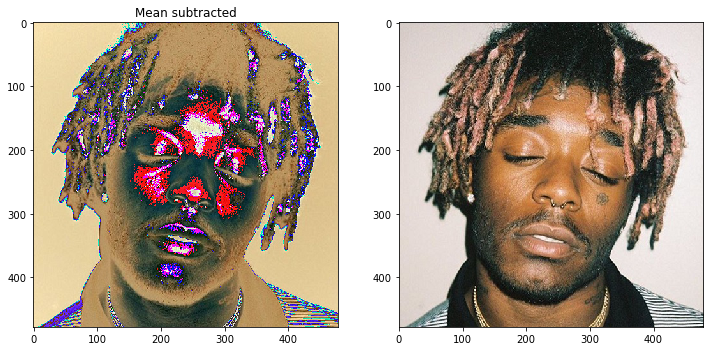

In [9]:
content_image = preprocess('liluzi.jpg') #famous modern rapper

plt.figure(figsize=(12,24))
plt.subplot(1,2,1)
plt.title('Mean subtracted')
imshow(content_image[0])
plt.subplot(1,2,2)
imshow((content_image + MEAN_VALUES)[0].astype('uint8'))

and the style image

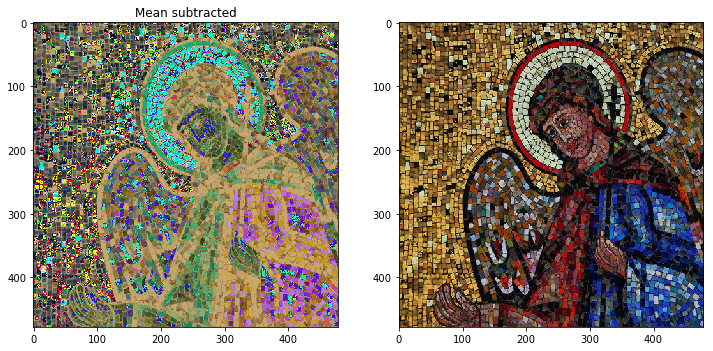

In [10]:
style_image = preprocess('mosaic.jpg') 

plt.figure(figsize=(12,24))
plt.subplot(1,2,1)
plt.title('Mean subtracted')
imshow(style_image[0])
plt.subplot(1,2,2)
imshow((style_image + MEAN_VALUES)[0].astype('uint8'))

## 3. Responses of each layer

Now let's see what happens to our content image as it goes through the layers of the network

In [12]:
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

#assign the content as input to the network
sess.run(model['input'].assign(content_image))

#get the outputs of each filter of 1 convolutional layer each from 5 sections
outputs = [sess.run(model['conv%d_2'%i]) for i in range(1,6)]
[['conv%d_2'%(i+1), o.shape] for i,o in enumerate(outputs)]

[['conv1_2', (1, 478, 478, 64)],
 ['conv2_2', (1, 239, 239, 128)],
 ['conv3_2', (1, 120, 120, 256)],
 ['conv4_2', (1, 60, 60, 512)],
 ['conv5_2', (1, 30, 30, 512)]]

As you go down the layers the number of pixels goes down from 478x478 to 30x30 this is because the image is downsampled by a factor a half everytime by an `avgpool` layer.

The number of outputs/filters in each layer goes from 64 to 512, we'll take 8 from each and see what they look like.

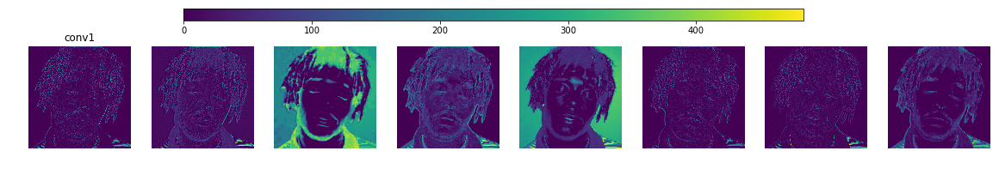

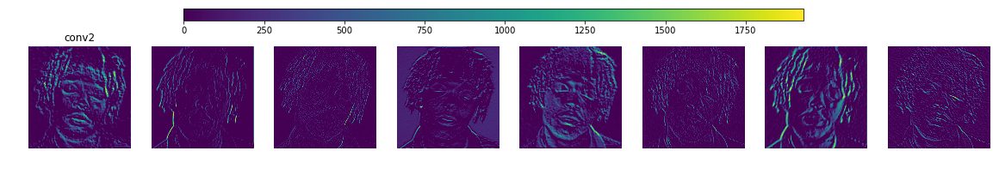

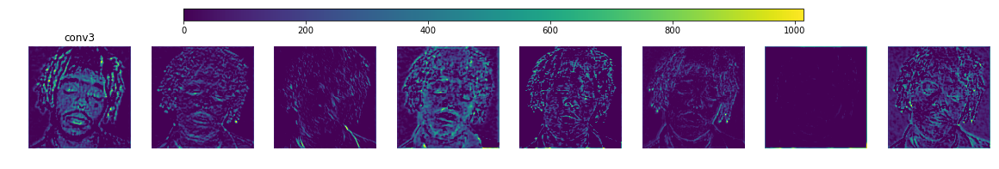

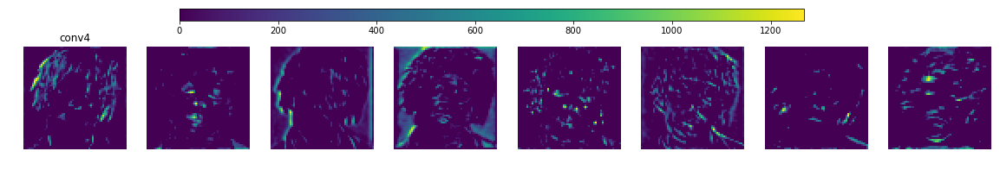

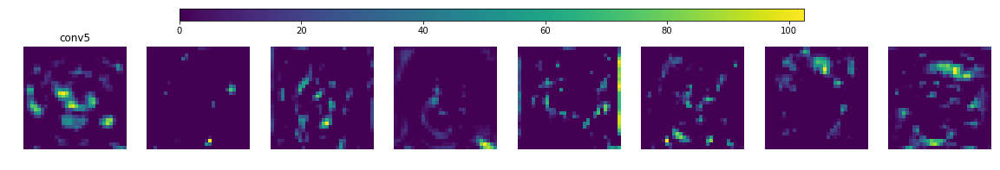

In [13]:
for i in range(len(outputs)):
    plt.figure(figsize=(20,2.5))
    
    for j in range(8):

        plt.subplot(1,8,j+1)
        plt.axis('off')
        imshow(outputs[i][0,:,:,j])
        
        if j==0:
            k=i+1
            plt.title('conv%d'%k)
    
    cax = plt.axes([0.25, 1, 0.5, 0.075])
    plt.colorbar(cax=cax,orientation='horizontal')

As you get deeper into the layers the output of each filter loses more and more features of the original image, but the number of outputs increases and each output may contain some features (that we may not even know of) of the original image, e.g. the colour of hair, position of the nose. The VGG network has already been trained to predict the object of the content image and so the kernels of the convolutions are already trained to "detect" features of the content image. We will choose the `conv5_3` layer later and combine all the outputs of the content from that layer which contains many features and call that the **content representation** (see Appendix B). 

Note that these are now single channel images. The colourbar shows that some pixels are over 255, this is to be expected as explained earlier (2nd paragraph of section 1.) that each input channel has it's own kernel/filter, and after each kernel is applied to each input of an image, they are all added together to give a single output (8 outputs chosen from each layer are shown above), see [conv2d documentation](https://www.tensorflow.org/api_docs/python/tf/nn/conv2d). 

For more images of the filters see appendix A.

## 4. Content loss

Using equation 1 in the [paper](https://arxiv.org/pdf/1508.06576.pdf)(explained in appendix B.1, equation B1) we can calculate the content loss and minimise it with gradient descent. The content loss is calculated by summing all the difference squares between the outputs of a layer when you input the content image and when you input a noise image (defined below). We will use the layer `conv5_3`. A deep layer is used as that has a higher "receptive field" meaning it captures the details of the image on a more local scale, you can see this in the figure below taken from Gatys et al figure 3, the local pattern (e.g. the strokes of the paint) of the painting is being embedded on to the smaller features in layer 5 but in layer 1 it is being embedded on larger parts of the content image. For a better explanation of the content loss see appendix B.1 (or read the paper).

![Outcomes](layer results.jpg)

The numbers at the top of the columns is $\alpha/\beta$ where $\alpha$ and $\beta$ are defined in equation 7 of the paper and used later on.

In [15]:
#p and x will be the outputs of the chosen layer from the content image and noise image
def contentloss(p, x):
    size = np.prod(p.shape[1:]) #p.shape = (1,height,width,no. of outputs)
    
    #equation 1 in the paper
    loss = (1./(2*size)) * tf.reduce_sum(tf.pow((x - p),2)) 
    
    #the equation in the paper does not use a normalisation constant "size", we use one here to match
    #the one for the style loss so that their weights, alpha and beta are in the right proportion
    
    return loss


### Noise input
Making the noise input for the content loss:

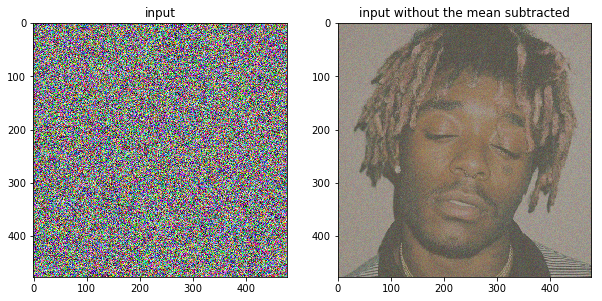

In [16]:
noise_image = np.random.uniform(-20, 20,(1, IMAGE_HEIGHT, IMAGE_WIDTH, INPUT_CHANNELS)).astype('float32')

#the effect of this parameter plays a role in how much 
#of the style will be embedded into the content image
noise_content_ratio = 0.7

input_noise = noise_image * noise_content_ratio + content_image * (1 - noise_content_ratio)

plt.figure(figsize=(10,20))

plt.subplot(1,2,1)
plt.title('input')
imshow(input_noise[0])
plt.subplot(1,2,2)
plt.title('input without the mean subtracted')
imshow((input_noise + MEAN_VALUES)[0].astype('uint8'))

The input_noise will be trained to output similar features to the content image and similar style as the style image. We will investigate the role of the `noise_content_ratio` in section 8.

In [17]:
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

We first assign the input to `content_image` so that `model['conv5_3']` will give the output of the `'conv5_3'` layer when `content_image` is the input. We then define `content_loss` as below so that `sess.run(model['conv5_3'])` will give the output of the `'conv5_3'` layer to whatever the input is at that time which will be the `noise_input` as we will assign the input to it later. `content_loss` can then calculate the contentloss from the `input_noise` and content image.

In [18]:
# Construct content_loss using content_image and noise_input (assigned later).
sess.run(model['input'].assign(content_image))
content_loss = contentloss(sess.run(model['conv5_3']), model['conv5_3'])

## 5. Style loss

For the style loss we will use the Gram matrix which is the style representation, defined in equation 3(explained in appendix B.2) of the [paper](https://arxiv.org/pdf/1508.06576.pdf). Like the content loss the style loss is the sum of the squared difference of the elements of the Gram matrix produced by the style image and the `input_noise` image. This time we will use all layers. The loss from a single layer is given in equation 4 (B2), and the total loss in equation 5 (B3) of the [paper](https://arxiv.org/pdf/1508.06576.pdf), we use different weights from all layers, as the higher the layer the more local the style will be transferred to the content image. We aim for a more local style transfer and choose the weights below. For a better explanation of the style loss and Gram matrix of a single layer see appendix B.2.

In [19]:
# Construct style_loss using style_image.

#assign the style image as input
sess.run(model['input'].assign(style_image))

#layers and weights in equation 5
STYLE_LAYERS = [
    ('conv1_1', 0.5),
    ('conv2_1', 1.3),
    ('conv3_1', 2.3),
    ('conv4_1', 3.1),
    ('conv5_1', 4.0),]

def gram_matrix(F, N, M):
    """
    The gram matrix G.
    """
    Ft = tf.reshape(F, (M, N))
    return tf.matmul(tf.transpose(Ft), Ft)

def style_loss(a, x):
    """
    The style loss calculation.
    """
    # N is the number of filters at some layer.
    N = a.shape[3]
    # M is the height*width of the outputs in the same layer.
    M = a.shape[1] * a.shape[2]
    # A is the style representation of the original image in the same layer.
    A = gram_matrix(a, N, M)
    # G is the style representation of the input_noise image in the same layer.
    G = gram_matrix(x, N, M)
    result = (1 / (4 * N**2 * M**2)) * tf.reduce_sum(tf.pow(G - A, 2))
    return result

#sess.run(model[layer_name]) will be the output of the layer when the noise image is assigned as input later
#model[layer_name] will be the output of the layer when the style iamge is assigned as input
E = [style_loss(sess.run(model[layer_name]), model[layer_name]) for layer_name, _ in STYLE_LAYERS]
W = [w for _, w in STYLE_LAYERS]

#equation 5 in the paper
styleloss = sum([W[l] * E[l] for l in range(len(STYLE_LAYERS))])


## 6. Total loss

Using equation 7 from the [paper](https://arxiv.org/pdf/1508.06576.pdf) we can combine the content and style loss so that the `input_noise` image is trained to output(in the layers) a similar style and features as the style and content image. 
$$L_{total} \ = \ \alpha L_{content} \ + \ \beta L_{style}$$

We use the figure in section 4 as a guide and choose parameters alpha/beta=0.01 so that the content is still recognizable. After the `input_noise` has been trained we can extract it and get the image that can output(in the layers) a similar style and content representations as the style and content image.

In [20]:
alpha = 1
beta = 100

#equation 7 from the paper
total_loss = alpha * content_loss + beta * styleloss

In [21]:
#minimize the total loss
train_step = tf.train.AdamOptimizer(1.5).minimize(total_loss)

## 7. Training

Now to assign the `noise_input` image as input and train the model.

In [28]:
sess.run(tf.global_variables_initializer())

#assign the noise image as input
sess.run(model['input'].assign(noise))

for it in range(2001):
    
    sess.run(train_step)
        #obtain the trained input_noise image every 100 iterations
        if it%100 == 0:
        
        mixed_image = sess.run(model['input'])
        
        print('iteration:',it,'cost: ', sess.run(total_loss))
        
        filename = 'out2/%d.png' % (it)
        deprocess(filename, mixed_image)
        


iteration: 0 cost:  7.45494e+11
iteration: 100 cost:  8.24306e+09
iteration: 200 cost:  2.97459e+09
iteration: 300 cost:  1.75665e+09
iteration: 400 cost:  1.23811e+09
iteration: 500 cost:  9.43114e+08
iteration: 600 cost:  7.50433e+08
iteration: 700 cost:  6.15972e+08
iteration: 800 cost:  5.17077e+08
iteration: 900 cost:  4.41694e+08
iteration: 1000 cost:  3.82687e+08
iteration: 1100 cost:  3.35401e+08
iteration: 1200 cost:  2.96861e+08
iteration: 1300 cost:  2.64709e+08
iteration: 1400 cost:  2.3769e+08
iteration: 1500 cost:  2.14629e+08
iteration: 1600 cost:  1.94709e+08
iteration: 1700 cost:  1.77407e+08
iteration: 1800 cost:  1.62231e+08
iteration: 1900 cost:  1.48853e+08
iteration: 2000 cost:  1.37001e+08


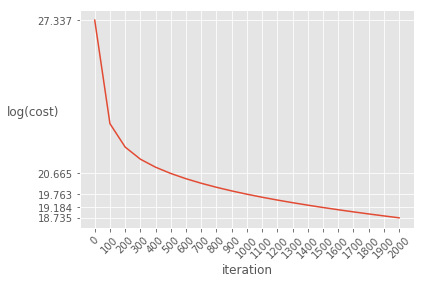

In [8]:
x=np.linspace(0,2000,21)
y=np.array([745494000000.0,
 8243060000.0,
 2974590000.0,
 1756650000.0,
 1238110000.0,
 943114000.0,
 750433000.0,
 615972000.0,
 517077000.0,
 441694000.0,
 382687000.0,
 335401000.0,
 296861000.0,
 264709000.0,
 237690000.0,
 214629000.0,
 194709000.0,
 177407000.0,
 162231000.0,
 148853000.0,
 137001000.0])
plt.style.use('ggplot')
plt.plot(x,np.log(y))
plt.ylabel('log(cost)', rotation=0)
plt.xlabel('iteration')
plt.xticks(np.linspace(0,2000,21), rotation=45);
plt.yticks([np.log(137001000.0),np.log(214629000.0),np.log(382687000.0),np.log(943114000.0),np.log(745494000000.0)]);

The rate that the cost drops, drops down drastically after 200 iterations. The training time is very slow on my laptop, it took around 5 hours. But the results turned out to be good.

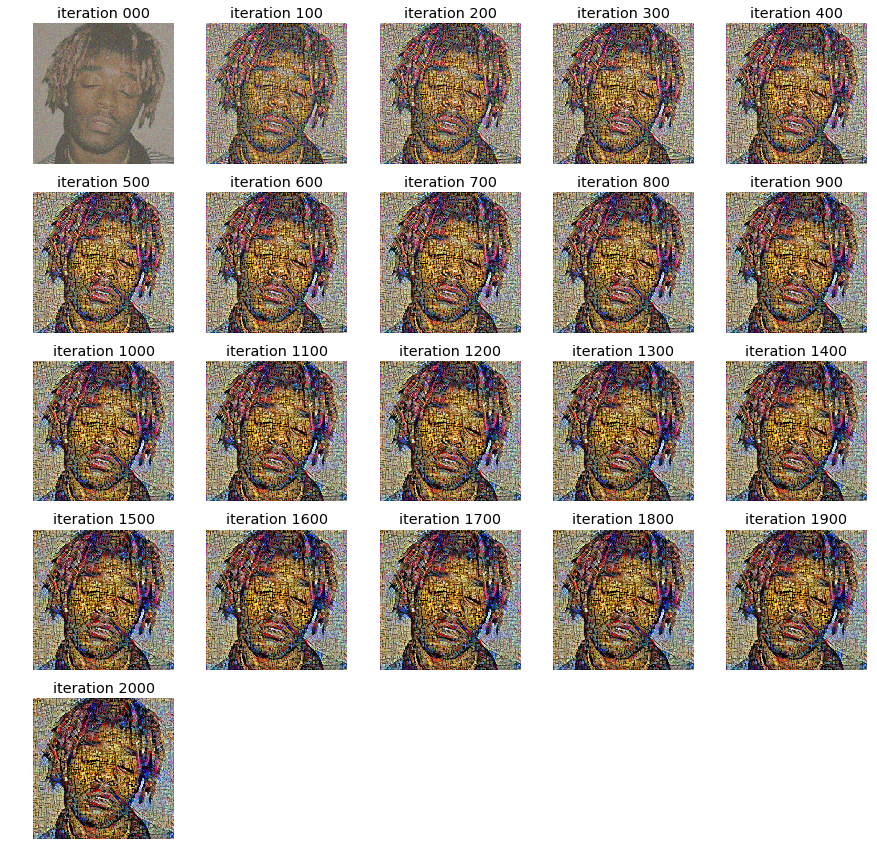

In [30]:
plt.figure(figsize=(15,15))
for i in range(21):

    plt.subplot(5,5,i+1)
    imshow(plt.imread('out2/%d00.png' % i))
    plt.axis('off')
    plt.title('iteration %d00' % i)


The patterns seemed to have formed somewhere before iteration 100, and the rest of the iterations doesn't do much except develop the colours. The final result:

![](liluzimosaic.jpg)

## 8. Effect of the noise content ratio

Using these content and style images:

Style (Thangka buddhist art)  |  Content (lil uzi vert)
:-------------------------:|:-------------------------:
![](thangka.jpg) | ![](liluzi.jpg)

We can investigate the effect of the noise content ratio of the image, here are some results of different noise content ratio's with only 100 iterations:

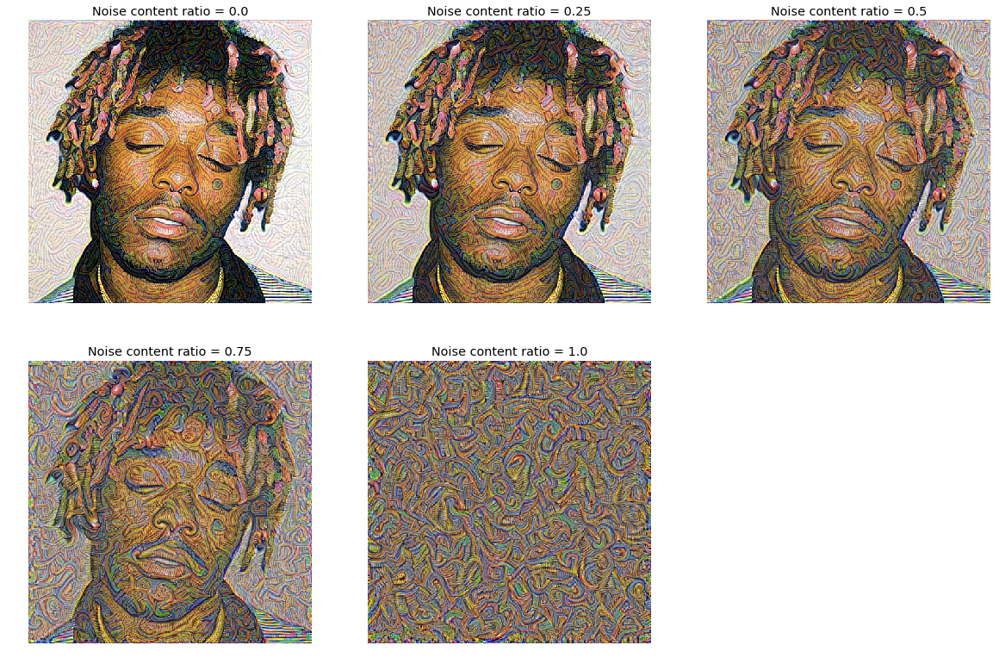

In [31]:
plt.figure(figsize=(20,13.33))
for i in range(5):
    plt.subplot(2,3,i+1)
    imshow(plt.imread('noise/%d.png' % i))
    plt.axis('off')
    plt.title('Noise content ratio = '+str(i/4))
    

With 0 noise content ratio (ncr) the content loss is 0 so there won't be much changes to the content image features (lil uzi's facial features) and the model will be trained to embedd the style onto those features. 

When the ncr is 1 the model is trained to create a picture of patterns from the style that are randomly distributed as it started from a pure noise image. 

As you increase the ncr from 0 to 1, more irregularities appear in the starting image (`input_noise`) and this creates more possibilities for the patterns to fit into the features of the content image while maintaining the shape/position (although it is less maintained for higher ncr) of the features, which is the role of the content loss. As the model is trained the patterns get refined on the content's features (lil uzi's facial features).

With 0.7 noise and 600 iterations here is a gif of the training process:

Iteration 0-100  |  Iteration 101-600
:-------------------------:|:-------------------------:
![](trainingprocess.gif) | ![](trainingprocess1.gif)

Iteration 0-100 shows the patterns forming, and the rest refines the colours. The final result:

![](liluzithangka.png)



## 9. Effects of the weights of the style loss

In section 5 we chose different weight's for each layer to calculate the style loss:

`STYLE_LAYERS = [
    ('conv1_1', w1),
    ('conv2_1', w2),
    ('conv3_1', w3),
    ('conv4_1', w4),
    ('conv5_1', w5),]`

We investigate how those weights effect the results and set all but one of them to 0. For example the first results below has the first layers weight w1 as 100 and the rest is 0. We do this for each layer to see each layers effect:

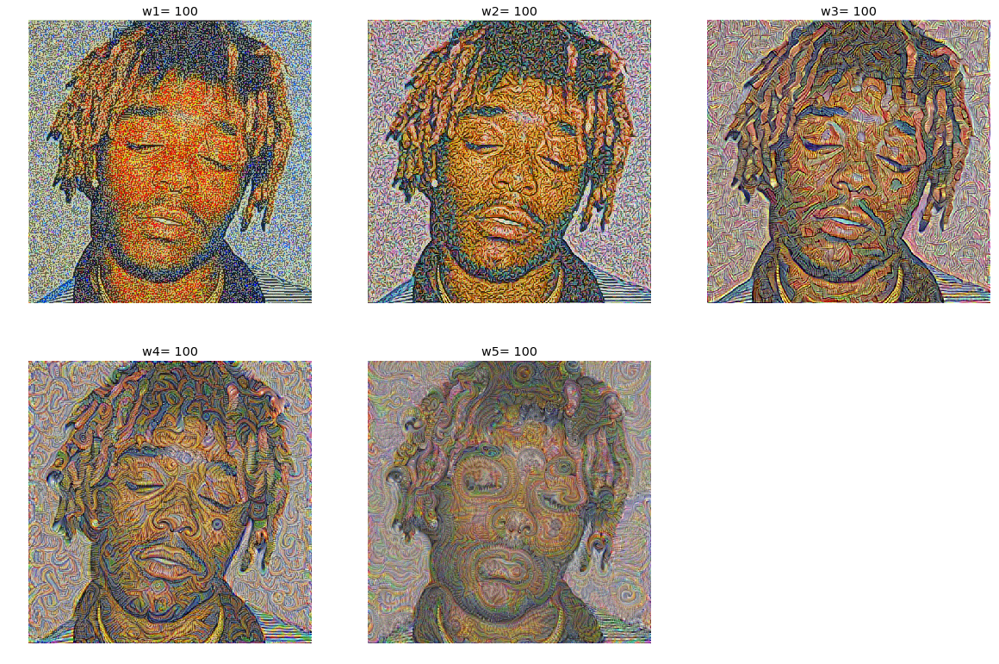

In [32]:
plt.figure(figsize=(20,13.33))
for i in range(1,6):
    plt.subplot(2,3,i)
    plt.imshow(plt.imread('reverse/%dconv100.png'%i))
    plt.axis('off')
    plt.title('w%d= 100'%i)

As explained earlier, as you go deeper into the layers the features of the outputs in each layer will become more and more local (see appendix A) so for the 5th image above, the style that is transferred is from very small patterns of the style image. For the first image the style that is transferred comes from the first layer of filters and so the style that is transferred comes from the larger scale patterns, here it looks like the large scale patterns are just the colours of the style image.

## Summary

We had control over $\alpha$, $\beta$, noise content ratio and the weights of the style loss of each layer. We used the figure in section 4 as a guide to choose $\alpha=1$ and $\beta=100$ so that the content is still recognizable. The noise content ratio was chosen to be 0.7 so that the patterns from the style are recognizable and stand out while maintaining the content features. The weights of the style loss are chosen so that we can combine the style transfer on all size scales from the style image. The results are shown below 

![](mosaicresults.jpg)

It seems that the most similar colour squares from the mosaic have been embedded onto the face, and some red squares embedded onto the red parts of the hair and lips.

![](thangkaresults.jpg)

The yellow hair from the thangka art is recognizable on the face, and some red parts of the hair have been filled with the fire although the shapes aren't recognizable. The background seems to be random patterns that were embedded into the noise. 

Overall the choice of style/content representation was successful in embedding patterns from the style image onto the content image.

## Appendix A

The outputs in each convolution layer. 64 from each layer have been chosen.

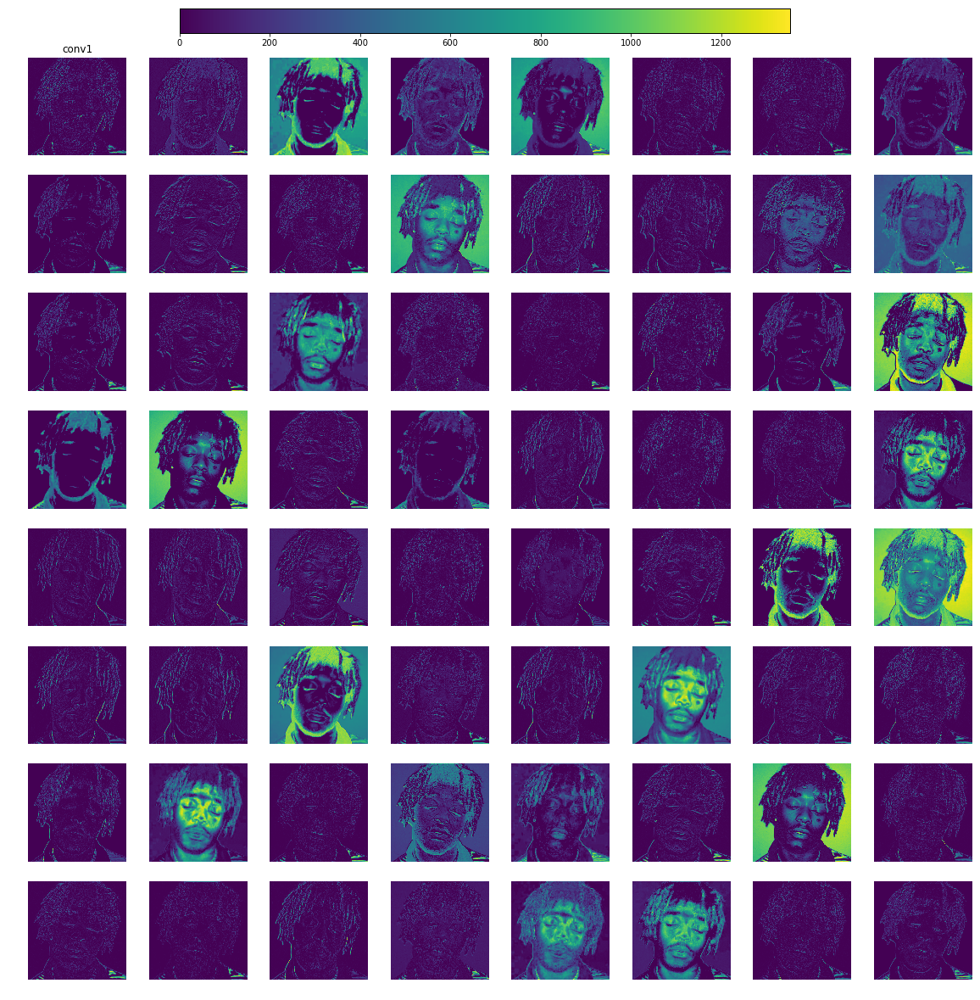

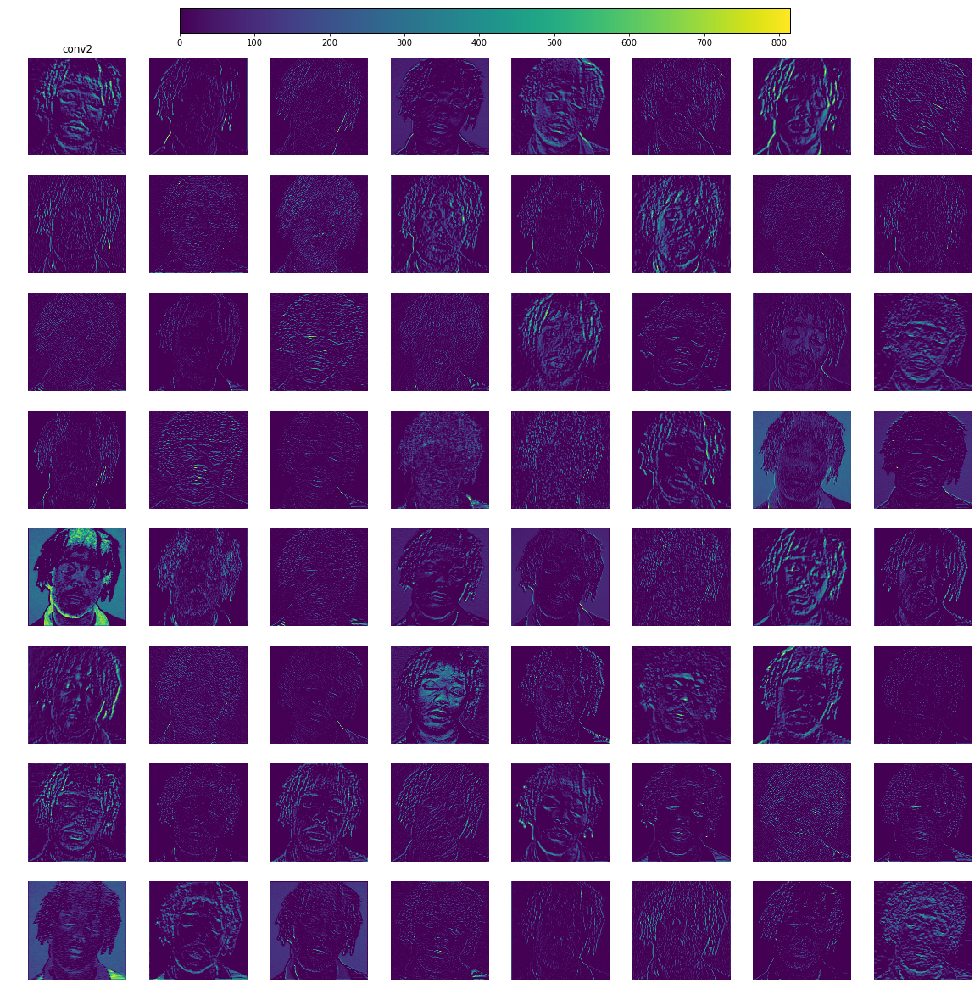

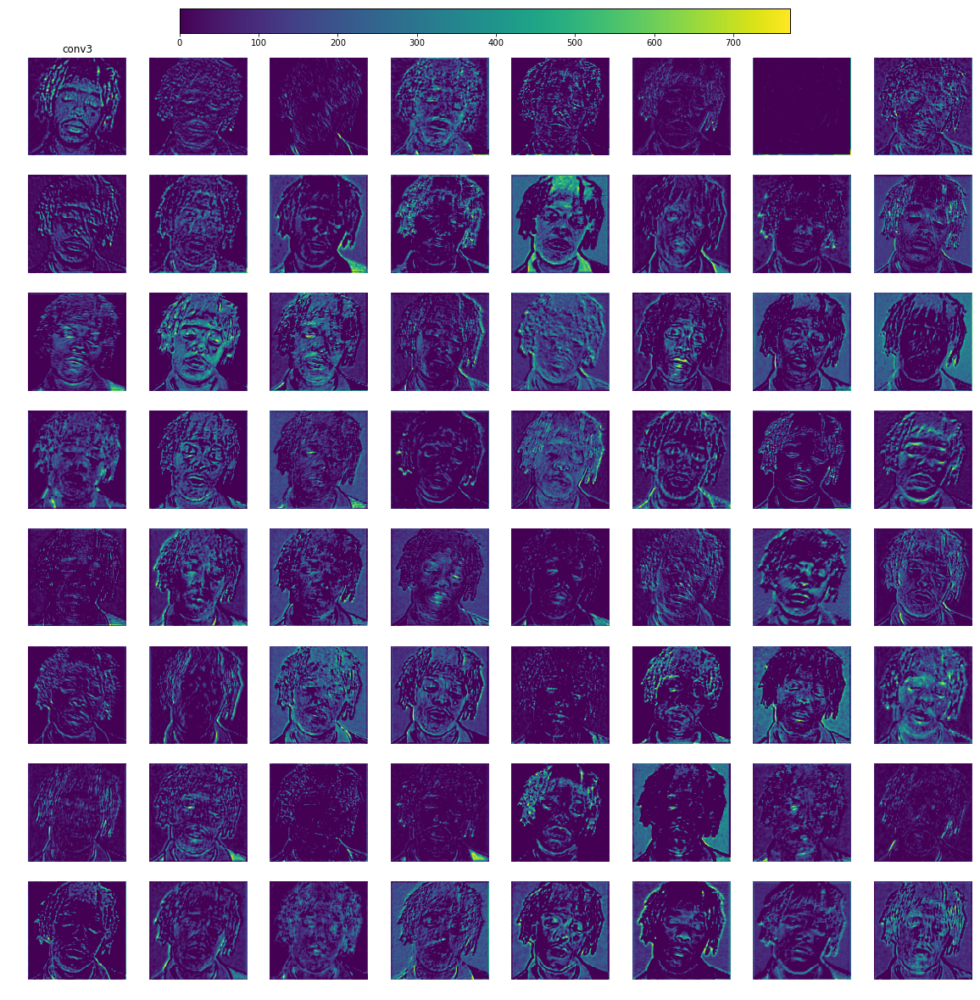

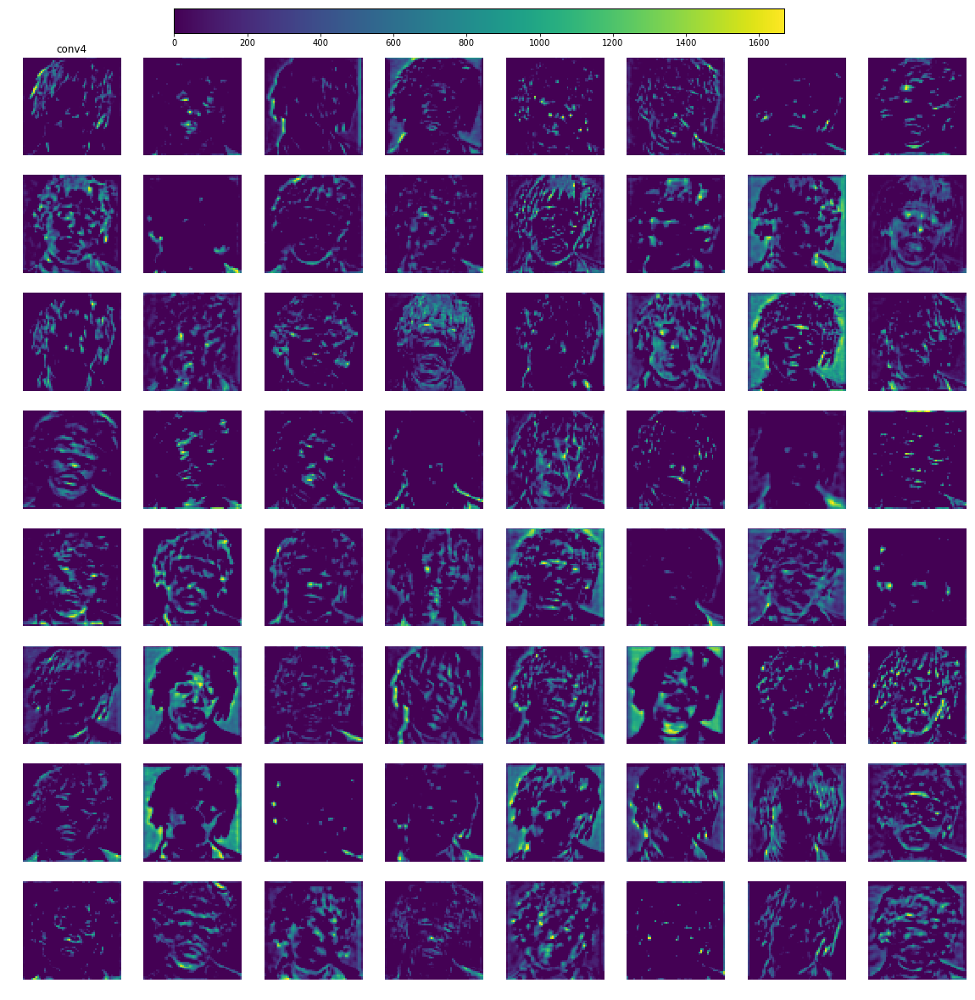

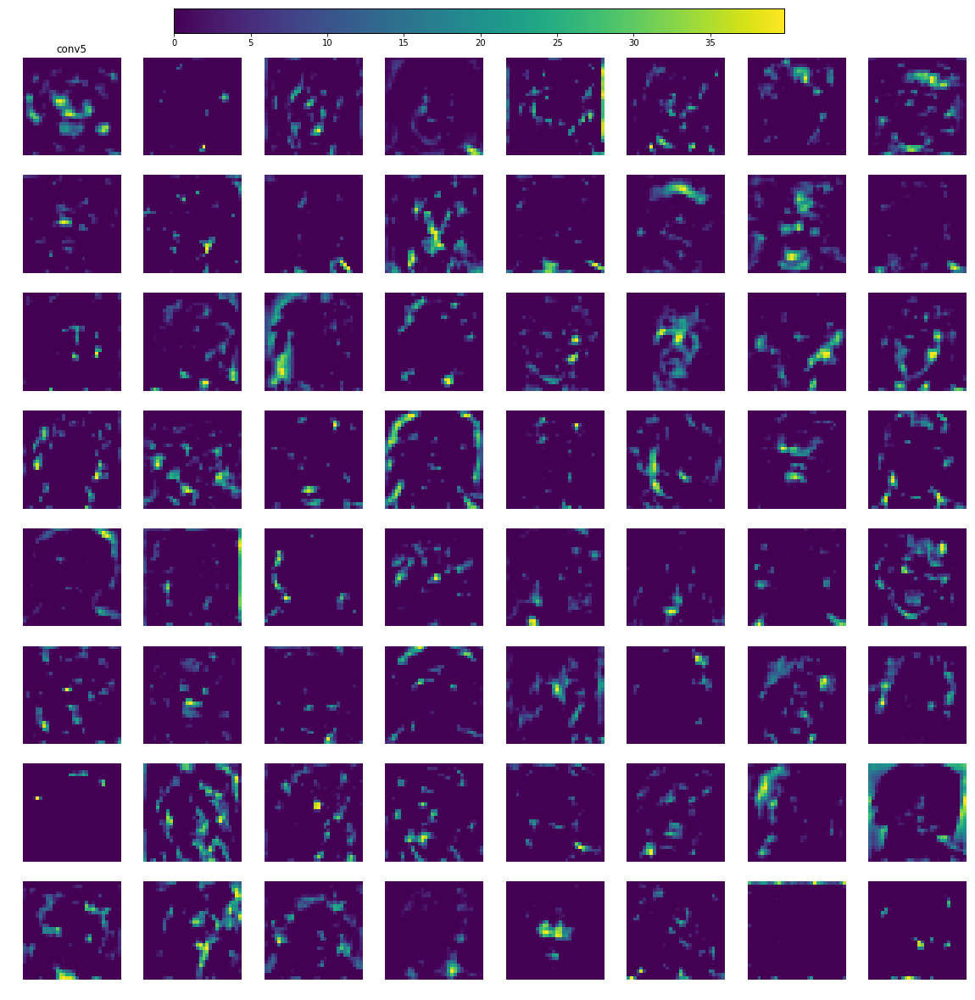

In [14]:
for i, out in enumerate(outputs):
    plt.figure(figsize=(20,20))
    for j in range(64):

        plt.subplot(8,8,j+1)
        plt.axis('off')
        imshow(out[0,:,:,j])
        if j==0:
            i=i+1
            plt.title('conv%d'%i)
        cax = plt.axes([0.25, 0.9, 0.5, 0.02])
        plt.colorbar(cax=cax,orientation='horizontal')

## Appendix B

When an image is input and reaches some layer with say 3 filters and the outputs of those filters has say 4 pixels each (see Appendix A for what the outputs of each filter looks like in our network). We can reshape those 4 pixels into a single row. We pile them on top of each other and call it the matrix F:

$$
\ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ pixels\rightarrow
$$
$$
F \ = \ filters \downarrow \left(\begin{array}{cc} 
f_{11} & f_{12} & f_{13} & f_{14}\\
f_{21} & f_{22} & f_{23} & f_{24}\\
f_{31} & f_{32} & f_{33} & f_{34}
\end{array}\right)
\\
\\
$$


Each row is associated with a filter and each column is associated with a pixel number, e.g. $f_{12}$ is a pixel from the output of the first filter and it's position is 2 (it's the 2nd pixel). Each filter has been trained to detect features (that we probably don't know of) such as edges of the object, position of hair etc. using a large dataset of images of objects . So each filter is associated with some kind of feature. 

When the input image is the content image, $F$ is the **content representation**.

### B.1 Content loss

When the content image is input you may get the above matrix for it $F_{content}$, and the features will be the outputs, similarly you may input the noise and get $F_{noise}$ and no obvious features will be detected. The content loss is the sum of all elements squared in the matrix  $F_{content} - F_{noise}$
$$L_{content} \ = \ \frac{1}{2N}\sum_{i \ , \ j}((F_{content})_{ij} - (F_{noise})_{ij})^2 \tag{B1}$$ 
where $N$ is the number of elements in $F$, and is a normalization constant. If the content loss is minimized with respect to the parameters of the network then the network will be trained so that the input noise image will output similar features to the content image.

### B.2 Style loss
Using the example $F$ above, the Gram matrix is defined like so:


$$
\\
G = F^TF \ = \ \left(\begin{array}{cc} 
f_{11} & f_{21} & f_{31}\\
f_{12} & f_{22} & f_{32}\\
f_{13} & f_{23} & f_{33}\\
f_{14} & f_{24} & f_{34}
\end{array}\right)
\left(\begin{array}{cc} 
f_{11} & f_{12} & f_{13} & f_{14}\\
f_{21} & f_{22} & f_{23} & f_{24}\\
f_{31} & f_{32} & f_{33} & f_{34}
\end{array}\right)
\\
= \left(\begin{array}{cc} 
.&.&.&.\\
.&.&.&.\\
.&.&.&.\\
.&.&.&.
\end{array}\right)
$$

The element on the 2nd row, 1st column for example is

$$ G_{21} = \left(\begin{array}{cc} 
f_{12} & f_{22} & f_{32}
\end{array}\right) \left(\begin{array}{cc} 
f_{11} \\
f_{21} \\
f_{31} 
\end{array}\right) \ = \ f_{12}f_{11} + f_{22}f_{21} + f_{32}f_{31}$$

Each term in $G_{21}$ is of the form $f_{X2}f_{X1}$ i.e. (filter X, pixel number 2) x (filter X, pixel number 1), so if the value of $G_{21}$ is high then that means those 2 pixels may have similar features because filter X is associated with a feature and the pixels that respond to a certain feature in that filter are non 0 (see layer 4 and 5 in appendix A which have a lot of 0 valued pixels). This is calculated for every pair of pixels and is the elements of the Gram matrix. This means that if you have an image with a repetitive pattern or style then you will have lots of elements $G_{ij}$ of the Gram matrix that are high if the pair of pixels i and j in $G_{ij}$ are part of the same motif (the thing that is being repeated to make the pattern e.g. a square in a mosaic). If the image does not have a repetitive pattern then you won't have as much big elements of $G$ compared to an image that does have a pattern.

We therefore call the Gram matrix the **style representation**.

The style loss of a layer l ,is the sum of differences squared of the elements in the Gram matrix created by the Style image and a Gram matrix created by the noise image. 
$$L_{style, \ l} \ = \ \frac{1}{4N^2}\sum_{i \ , \ j}((G_{style})_{ij} - (G_{noise})_{ij})^2 \tag{B2}$$
where $N$ is the number of elements in $F_{style}$, it is now squared to normalise the loss because $G$ contains elements of the form $F_{a,b}F_{c,d}$, so to the number of terms in the sum is $N\times N$. The total style loss is then the sum of all weighted style losses in each layer
$$L_{style} \ = \ \sum_{l}w_lL_{style, \ l} \tag{B3}$$
we have control over the weights $w_l$. If you train the network to minimize this the `input_noise` will be trained to output a similar Gram matrix and hence style representation to that of the style image, and therefore `input_noise` will be trained to develop a similar style.

### References
Leon A. Gatys, Alexander S. Ecker, Matthias Bethge, A Neural Algorithm of Artistic Style, 2015 : https://arxiv.org/pdf/1508.06576.pdf

log0, Implementing of a Neural Algorithm of Artistic Style : https://github.com/log0/neural-style-painting 

cmarkoh, NeuralArt : https://github.com/ckmarkoh/neuralart_tensorflow

Parag K Mital, Session 4: Visualizing Representations : https://github.com/pkmital/CADL/tree/master/session-4

Very Deep Convolutional Networks for Large-Scale Visual Recognition, Visual Geometry Group
Department of Engineering Science, University of Oxford : http://www.robots.ox.ac.uk/~vgg/research/very_deep/

